In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 5GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/covid19-global-forecasting-week-5/submission.csv
/kaggle/input/covid19-global-forecasting-week-5/test.csv
/kaggle/input/covid19-global-forecasting-week-5/train.csv


**Importing important libraries!!**

In [2]:
import seaborn as sns
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import plotly.express as px
from datetime import datetime
%matplotlib inline

**Reading our test and train datasets**

In [3]:
train=pd.read_csv("/kaggle/input/covid19-global-forecasting-week-5/train.csv")
test=pd.read_csv("/kaggle/input/covid19-global-forecasting-week-5/test.csv")
train.head()

,Id,County,Province_State,Country_Region,Population,Weight,Date,Target,TargetValue
0,1,NaN,NaN,Afghanistan,27657145,0.058359,2020-01-23,ConfirmedCases,0.0
1,2,NaN,NaN,Afghanistan,27657145,0.583587,2020-01-23,Fatalities,0.0
2,3,NaN,NaN,Afghanistan,27657145,0.058359,2020-01-24,ConfirmedCases,0.0
3,4,NaN,NaN,Afghanistan,27657145,0.583587,2020-01-24,Fatalities,0.0
4,5,NaN,NaN,Afghanistan,27657145,0.058359,2020-01-25,ConfirmedCases,0.0


In [4]:
test.head()

,ForecastId,County,Province_State,Country_Region,Population,Weight,Date,Target
0,1,NaN,NaN,Afghanistan,27657145,0.058359,2020-04-27,ConfirmedCases
1,2,NaN,NaN,Afghanistan,27657145,0.583587,2020-04-27,Fatalities
2,3,NaN,NaN,Afghanistan,27657145,0.058359,2020-04-28,ConfirmedCases
3,4,NaN,NaN,Afghanistan,27657145,0.583587,2020-04-28,Fatalities
4,5,NaN,NaN,Afghanistan,27657145,0.058359,2020-04-29,ConfirmedCases


**Checking out the size of the dataset of both train and test dataset respectively**

In [5]:
train.shape

(754934, 9)

In [6]:
test.shape

(311670, 8)

**Checking out the missing values!!So County and Province_State have lots of missing values which will be hard to recover**

In [7]:
train.isnull().sum()

Id                    0
County            69760
Province_State    40766
Country_Region        0
Population            0
Weight                0
Date                  0
Target                0
TargetValue           0
dtype: int64

In [8]:
test.isnull().sum()

ForecastId            0
County            28800
Province_State    16830
Country_Region        0
Population            0
Weight                0
Date                  0
Target                0
dtype: int64

**Saving the Train and Test ids for later use onto a new dataframe**

In [9]:
ID=train['Id']
FID=test['ForecastId']


**Dropping insignificant attributes which have a lot of missing values**

In [10]:
train=train.drop(columns=['County','Province_State','Id'])
test=test.drop(columns=['County','Province_State','ForecastId'])

**Visualizations to understand the correlations of attributes with each other and how they function and alter with different distribution**

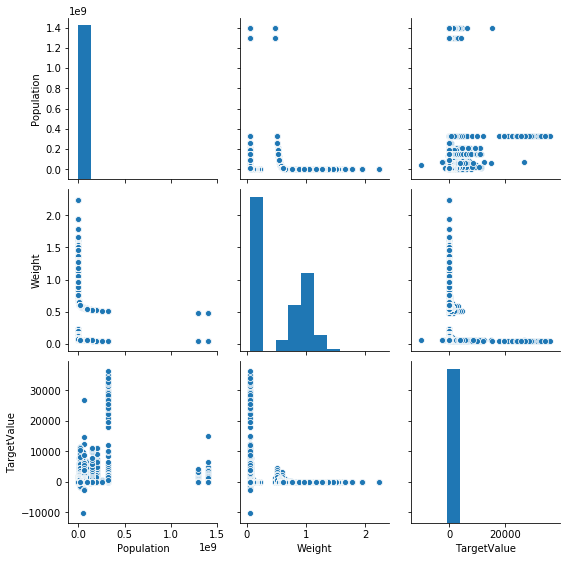

In [11]:
sns.pairplot(train)

**Target Value vs Target**

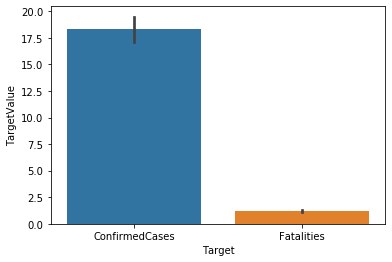

In [12]:
sns.barplot(y='TargetValue',x='Target',data=train)

**Population vs target Value**

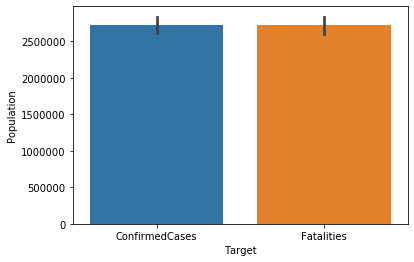

In [13]:
sns.barplot(x='Target',y='Population',data=train)

**Depicyion of target values country wise **

In [14]:
fig=plt.figure(figsize=(45,30))
fig=px.pie(train, values='TargetValue', names='Country_Region',color_discrete_sequence=px.colors.sequential.RdBu,hole=.4)
fig.update_traces(textposition='inside')
fig.update_layout(uniformtext_minsize=12, uniformtext_mode='hide')
fig.show()

<Figure size 3240x2160 with 0 Axes>

**Lets check out what we can learn from our dataset and fetch some important information!!**

In [15]:
df_grouped=train.groupby(['Country_Region']).sum()
df_grouped.TargetValue

Country_Region
Afghanistan           4522.0
Albania                899.0
Algeria               6225.0
Andorra                803.0
Angola                  47.0
                       ...  
West Bank and Gaza     377.0
Western Sahara           6.0
Yemen                   59.0
Zambia                 274.0
Zimbabwe                40.0
Name: TargetValue, Length: 187, dtype: float64

**Top 5 countries with the higest target value!**

In [16]:
plot=df_grouped.nlargest(5,'TargetValue')
plot

,Population,Weight,TargetValue
Country_Region,,,
US,213898536664,379214.414025,4212669.0
United Kingdom,14300914450,1257.050715,252379.0
Spain,10123575996,67.918013,250971.0
Italy,13225090118,66.905172,249630.0
Russia,31958621894,63.765699,211603.0


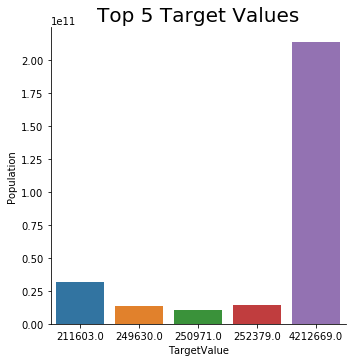

In [17]:
sns.catplot(y="Population", x="TargetValue",height=5,aspect=1,kind="bar", data=plot)
plt.title('Top 5 Target Values',size=20)
plt.show()

**Top 5 countries with the highest population**

In [18]:
plot=df_grouped.nlargest(5,'Population')
plot

,Population,Weight,TargetValue
Country_Region,,,
China,608557202400,2370.015305,176164.0
India,282355780000,57.144386,69373.0
US,213898536664,379214.414025,4212669.0
Indonesia,56397690000,61.896014,15005.0
Brazil,44937624674,62.630438,173822.0


**Visualizing Treemaps(nested rectangles)in terms of population,target value of every country. Each group is represented by a rectangle, which area is proportional to its value. Using color schemes, it is possible to represent several dimensions: groups, subgroups**

In [19]:
fig = px.treemap(train, path=['Country_Region'], values='TargetValue',
                  color='Population', hover_data=['Country_Region'],
                  color_continuous_scale='matter')
fig.show()

**Coverting Date to Int format in both test and train dataset!**

In [20]:
da= pd.to_datetime(train['Date'], errors='coerce')
train['Date']= da.dt.strftime("%Y%m%d").astype(int)
da= pd.to_datetime(test['Date'], errors='coerce')
test['Date']= da.dt.strftime("%Y%m%d").astype(int)

In [21]:
plot=train.nlargest(2000,'TargetValue')
plot

,Country_Region,Population,Weight,Date,Target,TargetValue
749886,US,324141489,0.051029,20200424,ConfirmedCases,36163.0
749858,US,324141489,0.051029,20200410,ConfirmedCases,35098.0
749900,US,324141489,0.051029,20200501,ConfirmedCases,34037.0
749846,US,324141489,0.051029,20200404,ConfirmedCases,33267.0
749854,US,324141489,0.051029,20200408,ConfirmedCases,32826.0
...,...,...,...,...,...,...
44870,Portugal,10374822,0.061901,20200422,ConfirmedCases,603.0
49429,Spain,46438422,0.566455,20200412,Fatalities,603.0
6969,Brazil,206135893,0.522356,20200507,Fatalities,602.0
32865,Italy,60665551,0.558008,20200414,Fatalities,602.0


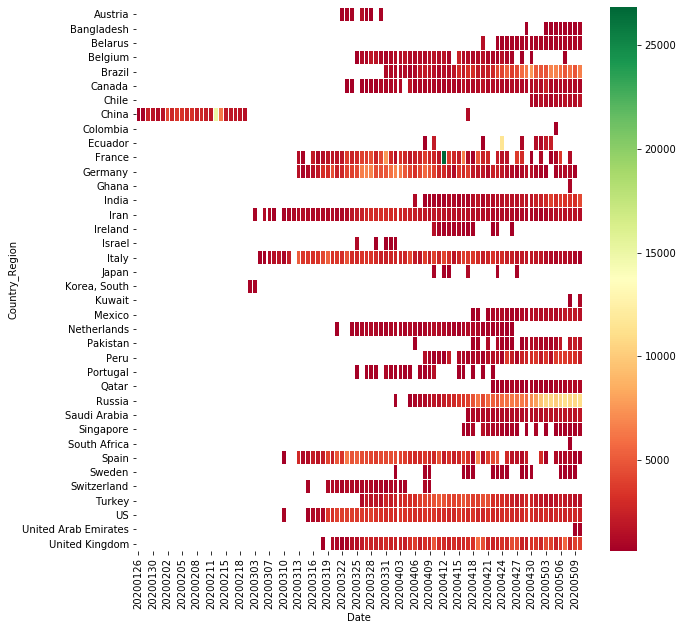

In [22]:
fig, ax = plt.subplots(figsize=(10,10))  
h=pd.pivot_table(plot,values='TargetValue',
index=['Country_Region'],
columns='Date')
sns.heatmap(h,cmap="RdYlGn",linewidths=0.05)

In [23]:
plot=train.nlargest(2000,'Population')
plot

,Country_Region,Population,Weight,Date,Target,TargetValue
19402,China,1395773400,0.047491,20200123,ConfirmedCases,95.0
19403,China,1395773400,0.474908,20200123,Fatalities,1.0
19404,China,1395773400,0.047491,20200124,ConfirmedCases,277.0
19405,China,1395773400,0.474908,20200124,Fatalities,8.0
19406,China,1395773400,0.047491,20200125,ConfirmedCases,486.0
...,...,...,...,...,...,...
33169,Japan,126960000,0.535923,20200208,Fatalities,0.0
33170,Japan,126960000,0.053592,20200209,ConfirmedCases,1.0
33171,Japan,126960000,0.535923,20200209,Fatalities,0.0
33172,Japan,126960000,0.053592,20200210,ConfirmedCases,0.0


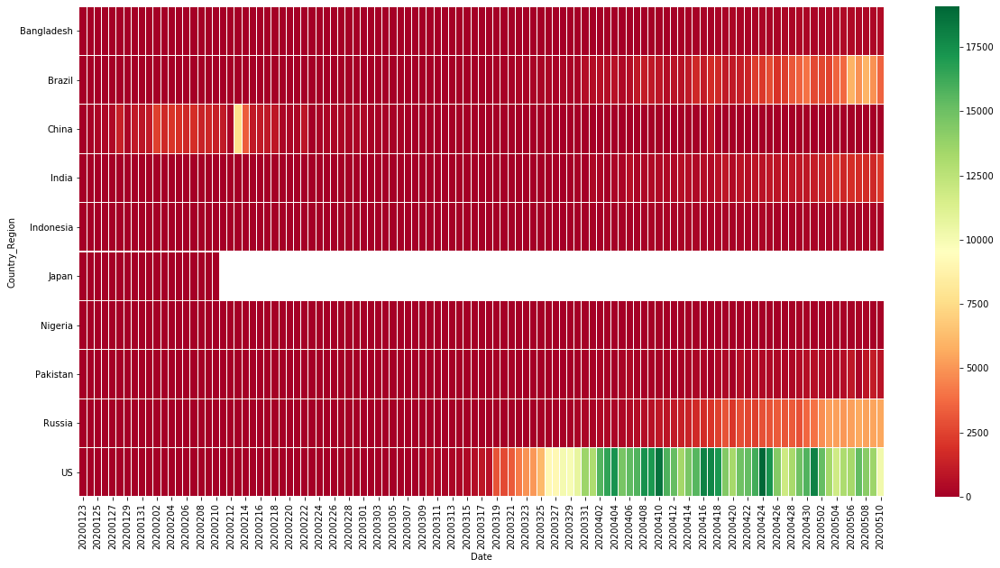

In [24]:
fig, ax = plt.subplots(figsize=(20,10))  
h=pd.pivot_table(plot,values='TargetValue',
index=['Country_Region'],
columns='Date')
sns.heatmap(h,cmap="RdYlGn",linewidths=0.005)

In [25]:
train.select_dtypes(include=['object']).columns

Index(['Country_Region', 'Target'], dtype='object')

In [26]:
test.select_dtypes(include=['object']).columns

Index(['Country_Region', 'Target'], dtype='object')

**Preprocessing data to transform object data types**

In [27]:
from sklearn.preprocessing import LabelEncoder
l = LabelEncoder()
X = train.iloc[:,0].values
train.iloc[:,0] = l.fit_transform(X.astype(str))

X = train.iloc[:,4].values
train.iloc[:,4] = l.fit_transform(X)

In [28]:
from sklearn.preprocessing import LabelEncoder
l = LabelEncoder()
X = test.iloc[:,0].values
test.iloc[:,0] = l.fit_transform(X.astype(str))

X = test.iloc[:,4].values
test.iloc[:,4] = l.fit_transform(X)

In [29]:
train.head()

,Country_Region,Population,Weight,Date,Target,TargetValue
0,0,27657145,0.058359,20200123,0,0.0
1,0,27657145,0.583587,20200123,1,0.0
2,0,27657145,0.058359,20200124,0,0.0
3,0,27657145,0.583587,20200124,1,0.0
4,0,27657145,0.058359,20200125,0,0.0


In [30]:

y_train=train['TargetValue']
x_train=train.drop(['TargetValue'],axis=1)

from sklearn.model_selection import train_test_split 

x_train, x_test, y_train, y_test = train_test_split(x_train, y_train, test_size=0.2, random_state=0)

In [31]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
pip = Pipeline([('scaler2' , StandardScaler()),
                        ('RandomForestRegressor: ', RandomForestRegressor())])
pip.fit(x_train , y_train)
prediction = pip.predict(x_test)

**Prediction score!!!Seems pretty good**

In [32]:
acc=pip.score(x_test,y_test)
acc

0.9275617378090987

In [33]:
predict=pip.predict(test)

In [34]:
output=pd.DataFrame({'id':FID,'TargetValue':predict})
output

,id,TargetValue
0,1,96.22
1,2,5.13
2,3,119.27
3,4,2.41
4,5,174.97
...,...,...
311665,311666,0.12
311666,311667,10.10
311667,311668,0.12
311668,311669,10.10


**Lets calculate the quantile values for the target values.In case you are wondering what is quantile function,here you go: Pandas dataframe.quantile() function return values at the given quantile over requested axis, a numpy.percentile.In each of any set of values of a variate which divide a frequency distribution into equal groups, each containing the same fraction of the total population.**[source](https://www.geeksforgeeks.org/python-pandas-dataframe-quantile/)

 Also I would like to mention that since I was strugling to get the final format as specified in the submission file I referred to  [this kernel](https://www.kaggle.com/nischaydnk/covid19-week5-visuals-randomforestregressor)!!

In [35]:
a=output.groupby(['id'])['TargetValue'].quantile(q=0.05).reset_index()
b=output.groupby(['id'])['TargetValue'].quantile(q=0.5).reset_index()
c=output.groupby(['id'])['TargetValue'].quantile(q=0.95).reset_index()
    
    

**Bringing all the calculated values into the same dataframe i.e values of q0.05 , q0.5 , 0.95 !!**

In [36]:
a.columns=['Id','q0.05']
b.columns=['Id','q0.5']
c.columns=['Id','q0.95']
a=pd.concat([a,b['q0.5'],c['q0.95']],1)
a['q0.05']=a['q0.05']
a['q0.5']=a['q0.5']
a['q0.95']=a['q0.95']
a

,Id,q0.05,q0.5,q0.95
0,1,96.22,96.22,96.22
1,2,5.13,5.13,5.13
2,3,119.27,119.27,119.27
3,4,2.41,2.41,2.41
4,5,174.97,174.97,174.97
...,...,...,...,...
311665,311666,0.12,0.12,0.12
311666,311667,10.10,10.10,10.10
311667,311668,0.12,0.12,0.12
311668,311669,10.10,10.10,10.10


**Time for making the submission!!**

In [37]:
sub=pd.melt(a, id_vars=['Id'], value_vars=['q0.05','q0.5','q0.95'])
sub['variable']=sub['variable'].str.replace("q","", regex=False)
sub['ForecastId_Quantile']=sub['Id'].astype(str)+'_'+sub['variable']
sub['TargetValue']=sub['value']
sub=sub[['ForecastId_Quantile','TargetValue']]
sub.reset_index(drop=True,inplace=True)
sub.to_csv("submission.csv",index=False)
sub.head()

,ForecastId_Quantile,TargetValue
0,1_0.05,96.22
1,2_0.05,5.13
2,3_0.05,119.27
3,4_0.05,2.41
4,5_0.05,174.97
